In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import re

## Loading data

In [3]:
rootPath = os.getcwd()
os.makedirs('data', exist_ok=True)

folder = 'data'
filePath = os.path.join(rootPath, folder)

fileFeatures = os.path.join(filePath, 'dengue_features_train.csv')
fileLabels = os.path.join(filePath, 'dengue_labels_train.csv')

X = pd.read_csv(os.path.join(filePath, fileFeatures))
y = pd.read_csv(os.path.join(filePath, fileLabels))

print(f"Data dimensions: X: {X.shape}, y: {y.shape}")


Data dimensions: X: (1456, 24), y: (1456, 4)


## 

In [4]:
# Join X and y for easy access
df = X.merge(y, on=['city', 'year', 'weekofyear'], how='left')


In [5]:
# change 
df['week_start_date'] = pd.to_datetime(df['week_start_date'])

In [6]:
# Checking number of observations
obs = df[['city', 'year']].groupby(['city', 'year']).size().reset_index(name='n')
city_obs = obs.loc[:,['city','n']].groupby('city').agg('sum').reset_index()
city_obs

,city,n
0,iq,520
1,sj,936


### Checking Missing values

In [7]:
print(f"Number of variables with missing instances: {sum(df.isna().any())}")

Number of variables with missing instances: 20


In [8]:
z = df.isna().any()
z = z.loc[lambda x: x == True]
with_missing = list(z.index)

# count missing instances for each feature 
missingCounts = {}
for c in with_missing:
    missingCounts[c] = sum(X[c].isna())

# print(f"{c} : {sum(X[c].isna())}")
missingCounts

{'ndvi_ne': 194,
 'ndvi_nw': 52,
 'ndvi_se': 22,
 'ndvi_sw': 22,
 'precipitation_amt_mm': 13,
 'reanalysis_air_temp_k': 10,
 'reanalysis_avg_temp_k': 10,
 'reanalysis_dew_point_temp_k': 10,
 'reanalysis_max_air_temp_k': 10,
 'reanalysis_min_air_temp_k': 10,
 'reanalysis_precip_amt_kg_per_m2': 10,
 'reanalysis_relative_humidity_percent': 10,
 'reanalysis_sat_precip_amt_mm': 13,
 'reanalysis_specific_humidity_g_per_kg': 10,
 'reanalysis_tdtr_k': 10,
 'station_avg_temp_c': 43,
 'station_diur_temp_rng_c': 43,
 'station_max_temp_c': 20,
 'station_min_temp_c': 14,
 'station_precip_mm': 22}

In [9]:
with_missing

['ndvi_ne',
 'ndvi_nw',
 'ndvi_se',
 'ndvi_sw',
 'precipitation_amt_mm',
 'reanalysis_air_temp_k',
 'reanalysis_avg_temp_k',
 'reanalysis_dew_point_temp_k',
 'reanalysis_max_air_temp_k',
 'reanalysis_min_air_temp_k',
 'reanalysis_precip_amt_kg_per_m2',
 'reanalysis_relative_humidity_percent',
 'reanalysis_sat_precip_amt_mm',
 'reanalysis_specific_humidity_g_per_kg',
 'reanalysis_tdtr_k',
 'station_avg_temp_c',
 'station_diur_temp_rng_c',
 'station_max_temp_c',
 'station_min_temp_c',
 'station_precip_mm']

In [10]:
# drop rows with all missing features
df_allmiss = df[df[with_missing].isna().all(axis=1)]
df_allmiss 
df.dropna(axis=0, how='all', subset=with_missing, inplace=True)


In [11]:
df.isna().sum(axis=0)

city                                       0
year                                       0
weekofyear                                 0
week_start_date                            0
ndvi_ne                                  189
ndvi_nw                                   47
ndvi_se                                   17
ndvi_sw                                   17
precipitation_amt_mm                       8
reanalysis_air_temp_k                      5
reanalysis_avg_temp_k                      5
reanalysis_dew_point_temp_k                5
reanalysis_max_air_temp_k                  5
reanalysis_min_air_temp_k                  5
reanalysis_precip_amt_kg_per_m2            5
reanalysis_relative_humidity_percent       5
reanalysis_sat_precip_amt_mm               8
reanalysis_specific_humidity_g_per_kg      5
reanalysis_tdtr_k                          5
station_avg_temp_c                        38
station_diur_temp_rng_c                   38
station_max_temp_c                        15
station_mi

In [12]:
# get rows with too many missing values
df[df.isnull().sum(axis=1)>10]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
87,sj,1992,1,1992-01-01,0.125100,0.157867,0.185283,0.181367,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81
399,sj,1998,1,1998-01-01,0.045500,0.047800,0.123986,0.083443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64
711,sj,2004,1,2004-01-01,-0.268300,-0.123700,0.223757,0.176543,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15
1118,iq,2004,1,2004-01-01,0.202571,0.198967,0.244557,0.187957,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4
1378,iq,2009,1,2009-01-01,0.151286,0.161686,0.153271,0.119443,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1


In [13]:

# Drop these rows too
df = df[df.isnull().sum(axis=1)<10]

In [14]:
# checking mising values once again
# The remaining missing will then be imputed 
df[df.isnull().any(axis=1)]

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
5,sj,1990,23,1990-06-04,NaN,0.174850,0.254314,0.181743,9.58,299.630000,...,79.891429,9.58,17.212857,2.100000,28.114286,6.942857,34.4,23.9,39.1,2
9,sj,1990,27,1990-07-02,NaN,0.121550,0.160683,0.202567,14.41,300.154286,...,81.281429,14.41,18.071429,2.014286,28.328571,6.514286,33.9,24.4,1.1,6
13,sj,1990,31,1990-07-30,NaN,0.247150,0.379700,0.381357,32.66,299.862857,...,80.584286,32.66,17.594286,2.585714,28.242857,8.085714,34.4,22.8,37.6,17
14,sj,1990,32,1990-08-06,NaN,0.064333,0.164443,0.138857,28.80,300.391429,...,79.650000,28.80,17.950000,2.328571,28.200000,7.557143,33.3,23.3,11.4,23
15,sj,1990,33,1990-08-13,NaN,0.128033,0.206957,0.168243,90.75,299.958571,...,84.178571,90.75,18.515714,1.857143,28.042857,6.685714,32.8,22.8,44.7,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1365,iq,2008,40,2008-09-30,0.393086,0.378271,0.343700,0.404843,24.28,299.178571,...,79.502857,24.28,16.331429,12.785714,NaN,NaN,36.0,19.6,1.0,45
1400,iq,2009,23,2009-06-04,0.114000,0.092443,0.097471,0.126286,42.22,296.125714,...,95.507143,42.22,16.757143,6.071429,28.100000,11.800000,34.0,22.2,NaN,3
1409,iq,2009,32,2009-08-06,0.395000,0.352733,0.484286,0.401914,9.79,297.370000,...,87.811429,9.79,16.337143,11.757143,27.975000,12.100000,35.4,20.5,NaN,5
1431,iq,2010,1,2010-01-08,0.124571,0.179129,0.163843,0.135471,27.04,299.264286,...,78.271429,27.04,16.127143,11.100000,28.600000,12.300000,35.1,21.8,NaN,10


# Train-test split
- data is time series, we take a future set instead of random split
- Roughly 2 percent of data is used as test set for each city. Iq 2 years, Sj 3 years

In [15]:
# Train set
df_train_iq = df[(df['city']=='iq') & (~df['year'].isin([2009, 2010]))]
df_train_sj = df[(df['city']=='sj') & (~df['year'].isin([2006, 2007, 2008]))]
df_train = pd.concat((df_train_iq,df_train_sj), axis=0)

# Test set
df_test_iq = df[(df['city']=='iq') & (df['year'].isin([2009, 2010]))]
df_test_sj = df[(df['city']=='sj') & (df['year'].isin([2006, 2007, 2008]))]
df_test = pd.concat((df_test_iq,df_test_sj), axis=0)


# Missing value imputation
- Missing values are replaced by median values in corresponding year of each city
- Robust to outliers
- Done separately for the training set and test set to avoid data leakage
- EDA is based on training set

In [16]:
# # Making it compatible with Pipelines
# from sklearn.base import BaseEstimator, TransformerMixin

# class MissingValueImputer(BaseEstimator, TransformerMixin):
#     def __init__(self, features):
#         self.features = features
    
#     def fit(self, X, y=None):
#         return self
    
#     def transform(self, X):
#         X_copy = X.copy()
#         for f in self.features:
#             X_copy.loc[:, f] = X_copy.groupby(['city', 'weekofyear'])[f].transform(lambda x: x.fillna(x.median()))
#         return X_copy.reset_index()

# # Example usage:
# imputer = MissingValueImputer(features=with_missing)
# df_train = imputer.transform(df_train).drop('index', axis=1)
# df_test = imputer.transform(df_test).drop('index', axis=1)

def replace_missing(df):
    exclude = ['year', 'week_start_date', 'total_cases']
    features = [c for c in df.columns if c not in exclude]
    median_variables = ['med_'+c for c in features if c not in ['city', 'weekofyear']]

    df_med = df[features].groupby(['city', 'weekofyear']).agg('median').reset_index()
    
    # Rename median columns
    df_med.columns = ['city', 'weekofyear']+ median_variables
    df1 = df.merge(df_med, how='left',on=['city', 'weekofyear'])

    for f in features:
        if df[f].isna().any():
            # replace missing values by median of the corresponding week of the city
            df1.loc[:,f] = df1[f].fillna(df1['med_'+f])
            # If no median is found, replace by preceding week values
            df1.loc[:,f] = df1.groupby('city')[f].ffill().reset_index()
    df1.reset_index(drop=True, inplace=True)
    df1 = df1.loc[:,~df1.columns.str.startswith('med_')]

    return df1

# Replace missing values 
df_train = replace_missing(df_train)
df_test = replace_missing(df_test)

In [17]:
type(df_train)

pandas.core.frame.DataFrame

In [18]:
df_test.isna().any()

city                                     False
year                                     False
weekofyear                               False
week_start_date                          False
ndvi_ne                                  False
ndvi_nw                                  False
ndvi_se                                  False
ndvi_sw                                  False
precipitation_amt_mm                     False
reanalysis_air_temp_k                    False
reanalysis_avg_temp_k                    False
reanalysis_dew_point_temp_k              False
reanalysis_max_air_temp_k                False
reanalysis_min_air_temp_k                False
reanalysis_precip_amt_kg_per_m2          False
reanalysis_relative_humidity_percent     False
reanalysis_sat_precip_amt_mm             False
reanalysis_specific_humidity_g_per_kg    False
reanalysis_tdtr_k                        False
station_avg_temp_c                       False
station_diur_temp_rng_c                  False
station_max_t

In [19]:
# Convert week start date to datetime format
df_train['week_start_date'] = pd.to_datetime(df_train['week_start_date'])
df_train

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,iq,2000,26,2000-07-01,0.192886,0.132257,0.340886,0.247200,25.41,296.740000,...,92.418571,25.41,16.651429,8.928571,26.400000,10.775000,32.5,20.7,3.0,0
1,iq,2000,27,2000-07-08,0.216833,0.276100,0.289457,0.241657,60.61,296.634286,...,93.581429,60.61,16.862857,10.314286,26.900000,11.566667,34.0,20.8,55.6,0
2,iq,2000,28,2000-07-15,0.176757,0.173129,0.204114,0.128014,55.52,296.415714,...,95.848571,55.52,17.120000,7.385714,26.800000,11.466667,33.0,20.7,38.1,0
3,iq,2000,29,2000-07-22,0.227729,0.145429,0.254200,0.200314,5.60,295.357143,...,87.234286,5.60,14.431429,9.114286,25.766667,10.533333,31.5,14.7,30.0,0
4,iq,2000,30,2000-07-29,0.328643,0.322129,0.254371,0.361043,62.76,296.432857,...,88.161429,62.76,15.444286,9.500000,26.600000,11.480000,33.3,19.1,4.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1244,sj,2005,47,2005-11-26,0.076400,0.165400,0.215914,0.185229,14.49,299.467143,...,77.245714,14.49,16.548571,2.585714,26.528571,6.085714,30.0,22.2,23.6,22
1245,sj,2005,48,2005-12-03,0.108625,0.182300,0.268600,0.248186,26.65,299.182857,...,78.624286,26.65,16.571429,2.414286,26.228571,5.871429,30.6,22.8,80.7,26
1246,sj,2005,49,2005-12-10,-0.033967,0.041350,0.181267,0.206850,0.00,298.578571,...,71.455714,0.00,14.507143,2.742857,24.985714,6.328571,28.9,20.6,27.5,13
1247,sj,2005,50,2005-12-17,-0.058700,-0.077533,0.166757,0.169514,0.00,299.131429,...,75.075714,0.00,15.721429,2.171429,25.457143,6.028571,29.4,21.1,30.0,17


In [20]:
# checking if conversion was successful
type(df_train['week_start_date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [21]:
df_train.columns
datetimecols = ['city',	'year',	'weekofyear', 'week_start_date']
features = [c for c in df_train.columns if c not in datetimecols]

# TIME SERIES PLOTS

## All cities

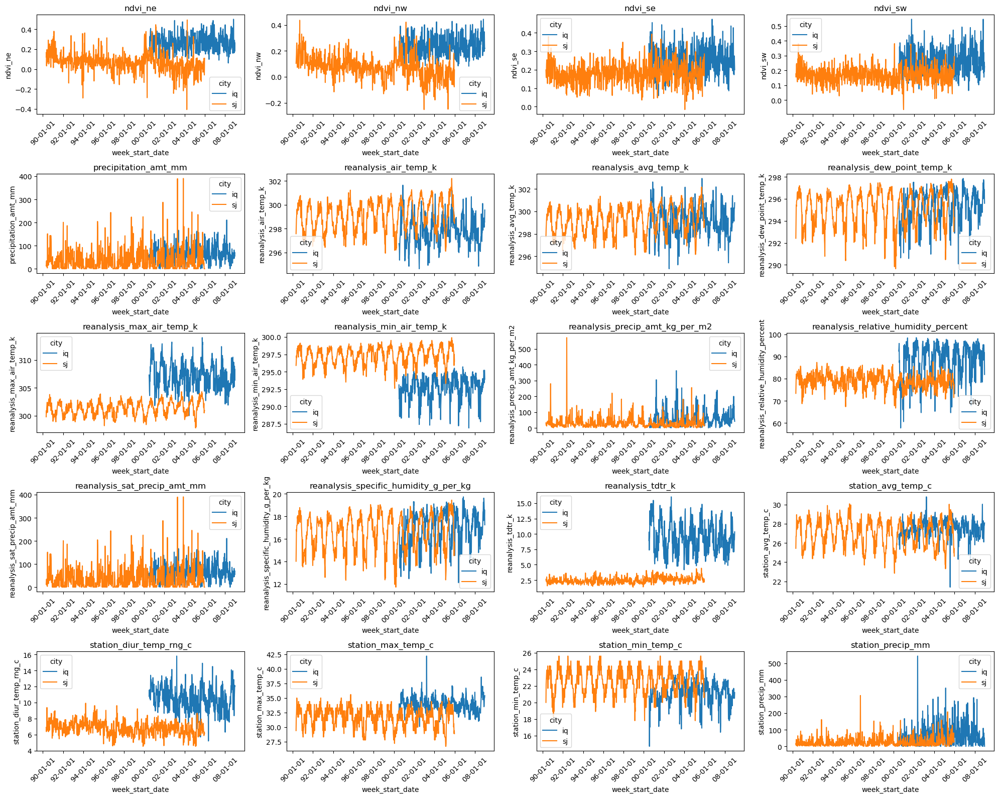

In [22]:
import matplotlib.dates as mdates

def linePlots(data, hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)  # Add this line
    plt.tight_layout()
    plt.show()

linePlots(data=df_train, hue='city')

## San Juan
- There appears to be some outliers


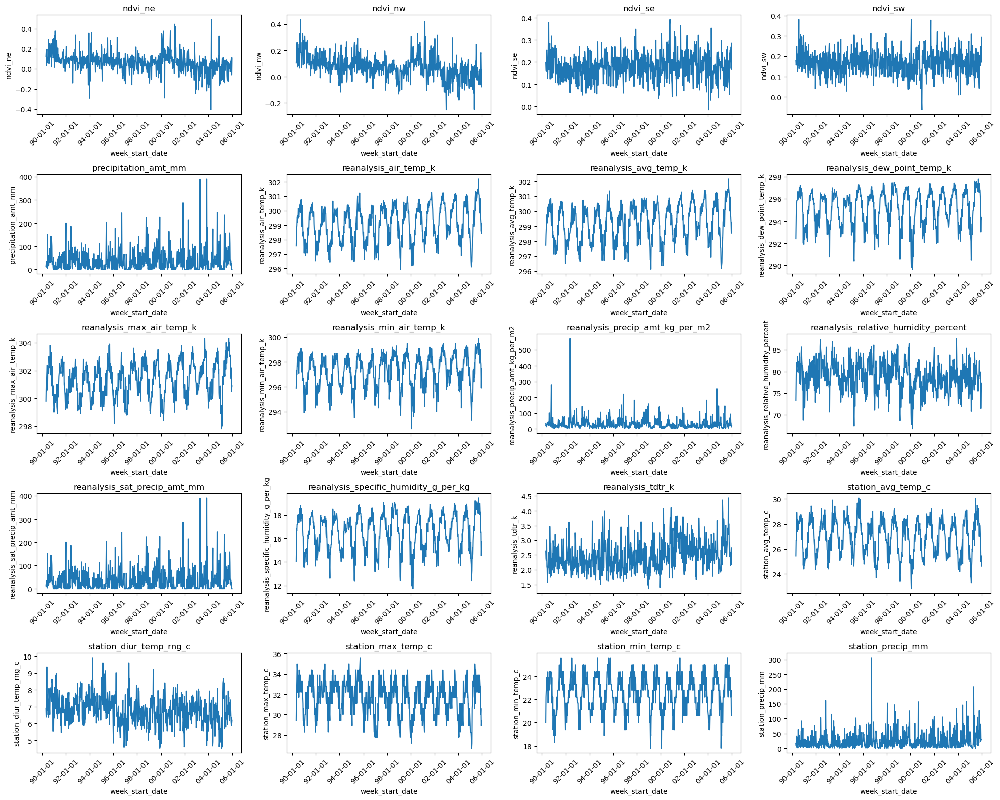

In [23]:
# Data
df_train_sj = df_train.query("city=='sj'")
linePlots(data=df_train_sj)

## Iquitos
- There appears to be some outliers

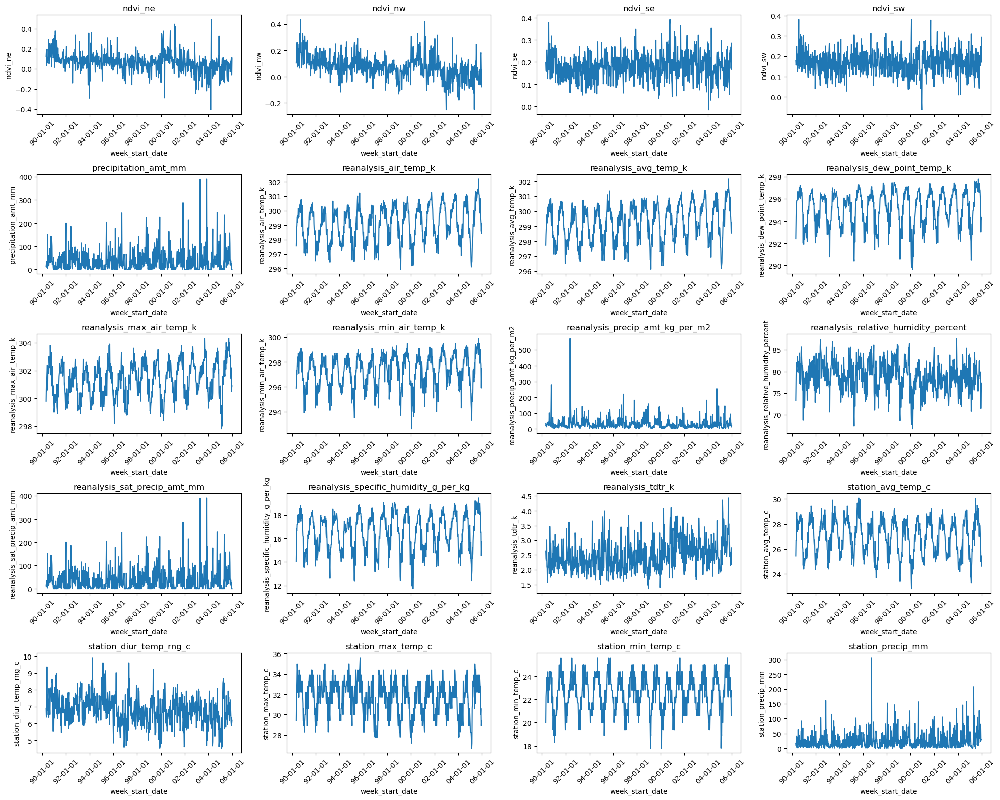

In [24]:
df_train_iq = df_train.query("city!='iq'")
linePlots(data=df_train_iq, hue=None)

## Correlation analysis
Based on the Heatmap above, we observe the following:
*   Vegetation at north east "ndvi_ne" and north west  "ndvi_nw"are highly positively correlated at 0.85 and the vegetation south east "ndvi_se" and southwest "ndvi_sw" positively correlated at 0.82
*   The Average air temperature "reanalysis_avg_temp_k" and  Mean air temperature "reanalysis_air_temp_k" are highly positively correlated at 0.90
*   The Diurnal temperature range "reanalysis_tdtr_k" and Maximum air temperature "reanalysis_max_air_temp_k" are highly positively correlated at 0.92
*    The Diurnal temperature range "reanalysis_tdtr_k" and Total precipitation "reanalysis_precip_amt_kg_per_m2" have a low correlation of 0.094
*   The Mean relative humidity "reanalysis_relative_humidity_percent" and Minimum temperature "station_min_temp_c" have low negative correlation -0.043
* All features seem be weakly correlated with `total_cases`




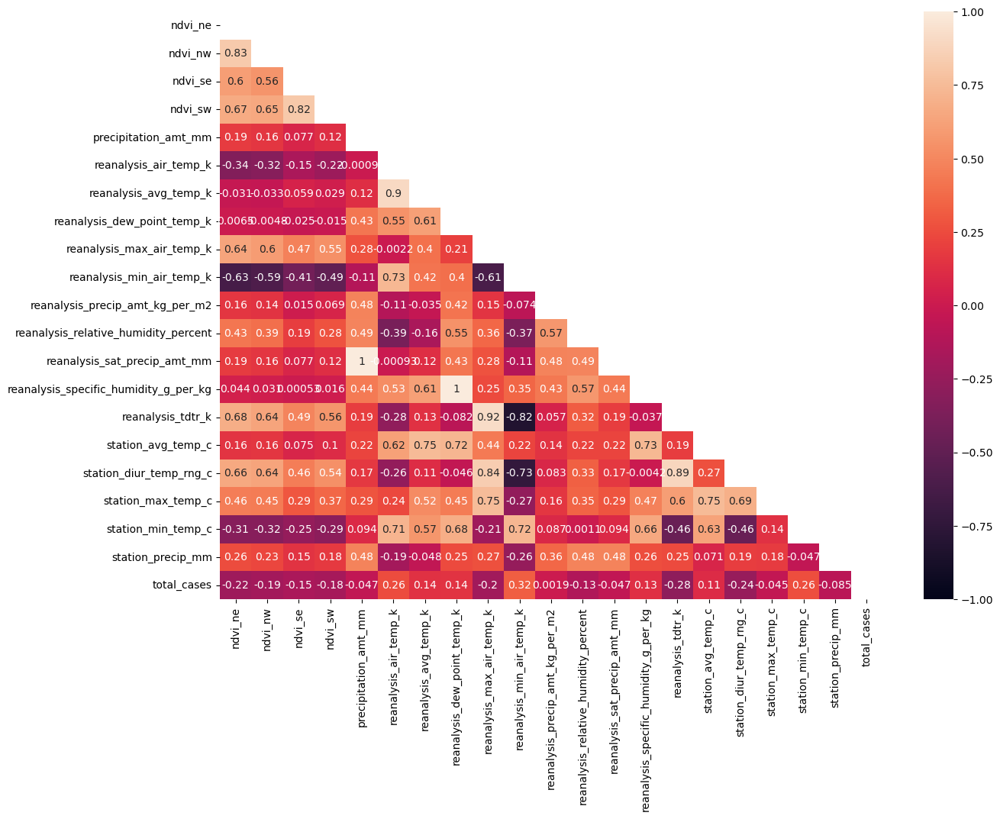

In [25]:
corrMat = df_train.loc[:,features].corr()

mask = np.zeros_like(corrMat)
mask[np.triu_indices_from(mask)]=True


import seaborn as sns
plt.figure(figsize =(14,10))
sns.heatmap(corrMat,vmin = -1, vmax = 1, annot=True, mask=mask)
plt.show()


### Identify highly correlated variables``

In [26]:
# corrMat[corrMat>0.9]
pair = []
for c in corrMat:
    if any(corrMat[c]>0.9) or any(corrMat[c]<-0.9):
        high_corr = corrMat[corrMat[c]>0.9].index.to_list()
    if len(high_corr)>1:
        print(high_corr)

['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']
['reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg']
['reanalysis_max_air_temp_k', 'reanalysis_tdtr_k']
['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']
['reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg']
['reanalysis_max_air_temp_k', 'reanalysis_tdtr_k']


In [27]:
from sklearn.manifold import MDS
dist_mat=1-corrMat
mds = MDS(n_components=2, dissimilarity='precomputed', normalized_stress='auto')
mds_out = mds.fit_transform(dist_mat)

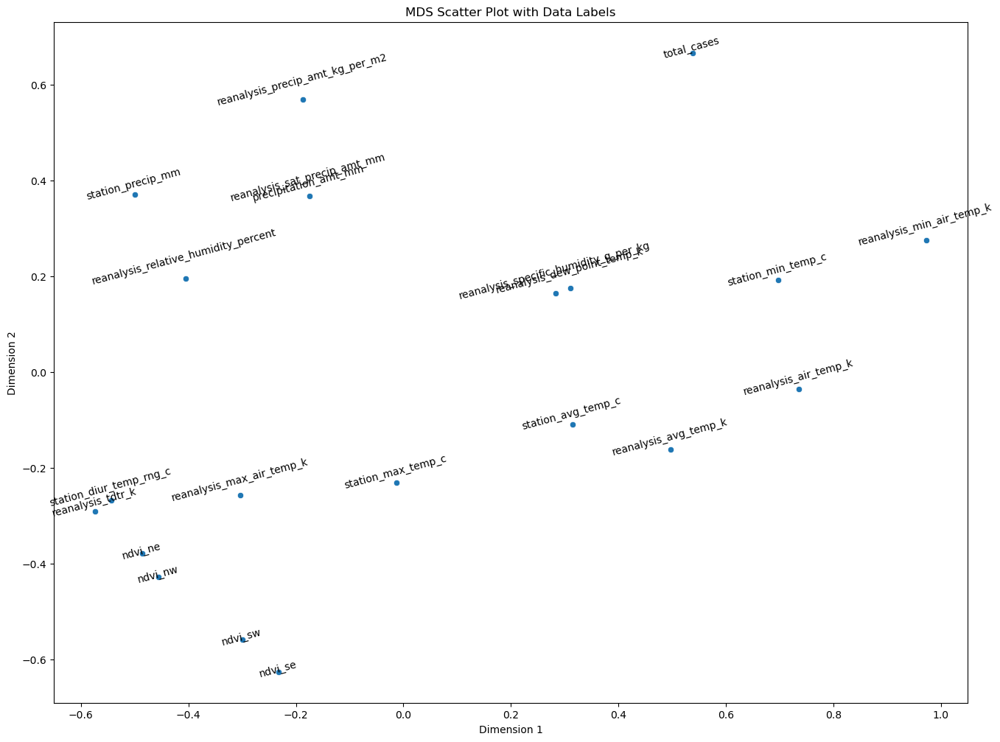

In [28]:
mds_out = pd.DataFrame(mds_out, columns=['c1', 'c2'])
mds_out.index = mds.feature_names_in_

plt.figure(figsize=(16, 12))
sns.scatterplot(data=mds_out,x='c1', y='c2')

for label, x, y in zip(mds_out.index, mds_out['c1'], mds_out['c2']):
    plt.annotate(label, (x, y), textcoords="offset points", xytext=(-1, -5), ha='center', rotation=15)

# Show the plot
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('MDS Scatter Plot with Data Labels')
plt.show()

In [29]:
mds.feature_names_in_

array(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm',
       'reanalysis_air_temp_k', 'reanalysis_avg_temp_k',
       'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k',
       'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent',
       'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c',
       'station_max_temp_c', 'station_min_temp_c', 'station_precip_mm',
       'total_cases'], dtype=object)

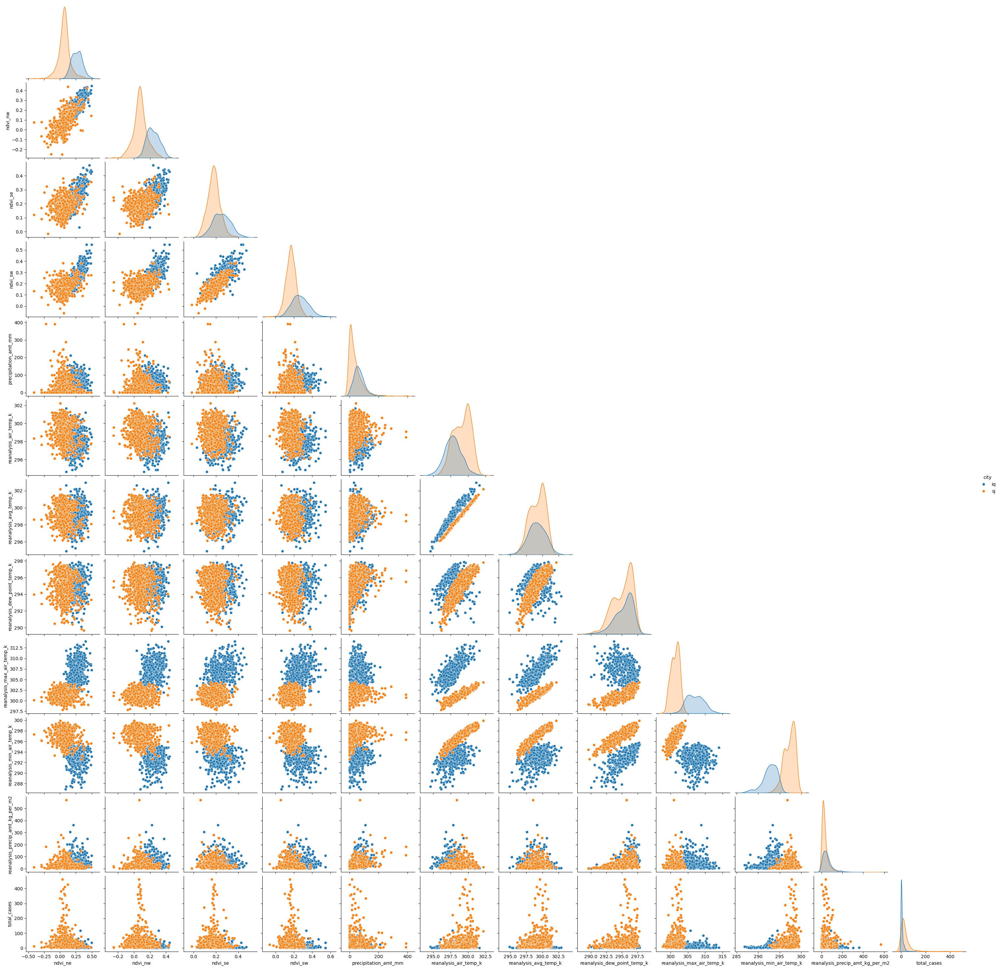

In [30]:
features_set1 = features[:11] + [features[-1]]


sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

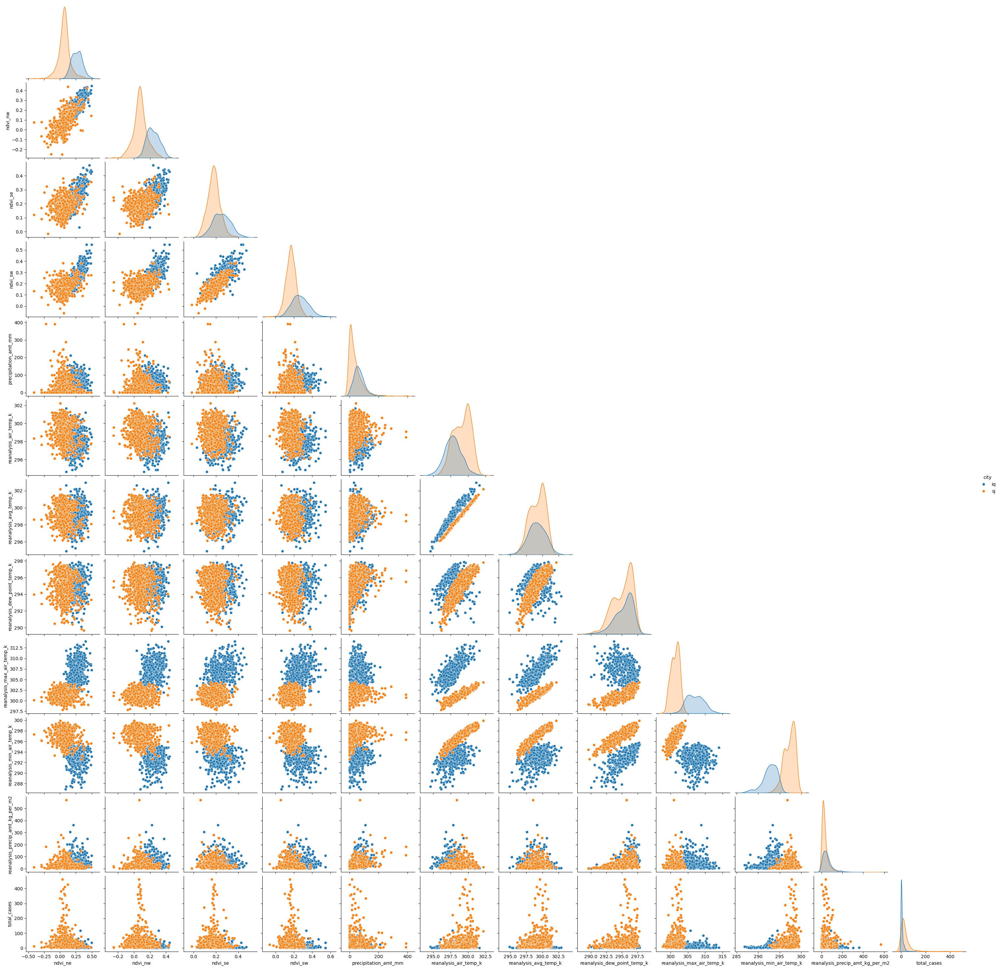

In [31]:
features_set2 = features[11:] + [features[-1]]


sns.pairplot(data=df_train,vars=features_set1, corner=True, hue='city')
plt.show()

## Dengue cases


## Dengue cases time series

- The data spans different periods in the two cities, with some overlaps

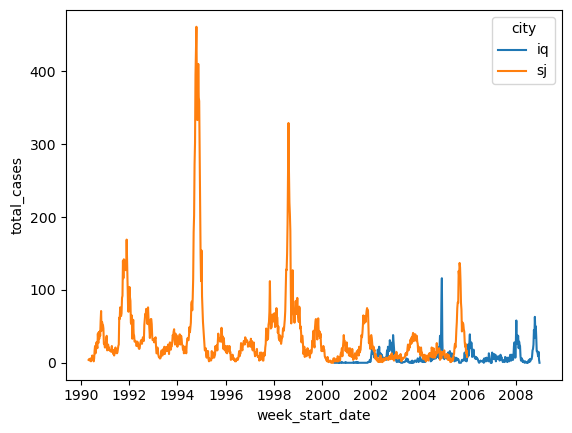

In [32]:
sns.lineplot(data=df_train, x= 'week_start_date', y = 'total_cases', hue='city')
plt.show()

## Iquitos - Total cases
- number of cases are generally high towards end of year (week 40 - 52) and at the beginning of year (week 1 to week 10)
- time feature may me important

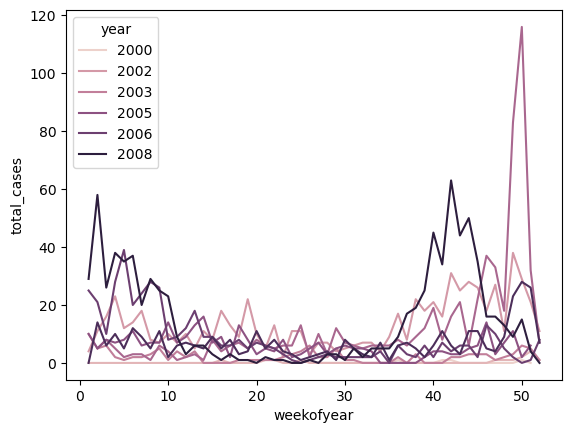

In [33]:
sns.lineplot(data=df_train.loc[df_train['city']=='iq'], x= 'weekofyear', y = 'total_cases', hue='year')
plt.show()

## Cases San Juan
- Also, number of cases are higher towards end of year from around week 35 - 52, and at the beginning of year week 1 - 10 with some few exceptions

In [34]:
# Identify outlier years
# 
outlier_years_sj = df_train.loc[df_train['city']=='sj'].loc[df_train['total_cases']>200,'year'].unique() 
years_sj = df_train.loc[df_train['city']=='sj']['year'].unique()
normal_years_sj = [i for i in years_sj if i not in outlier_years_sj]

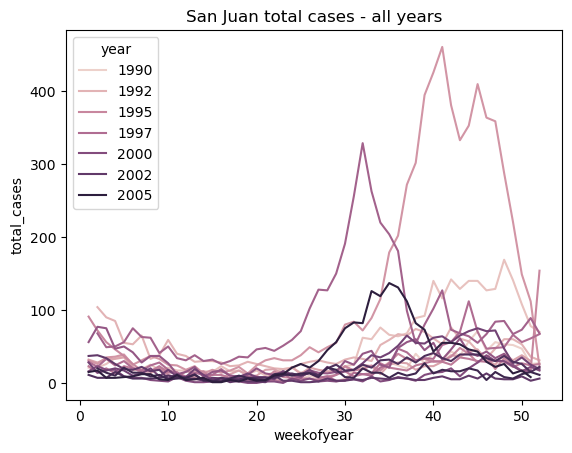

In [35]:
## San Juan - Total cases
cases_sj = df_train.loc[(df_train['city']=='sj') & (df_train['year'].isin(years_sj))]
sns.lineplot(data=cases_sj, x= 'weekofyear', y = 'total_cases', hue='year')
plt.title('San Juan total cases - all years')
plt.show()

Outlier years were identified as those containing too many cases relative to others, distorting the scale. The threshold was 200 cases.

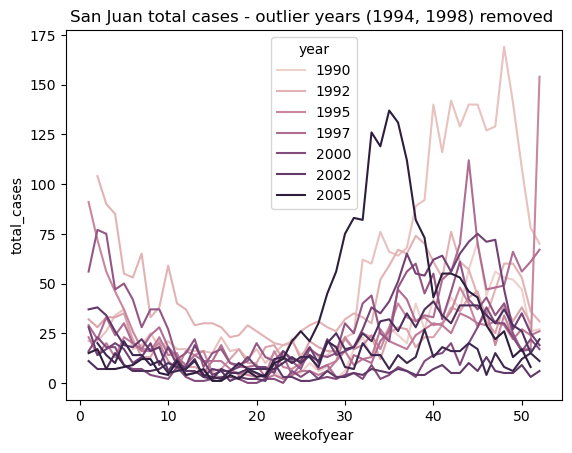

In [36]:
## San Juan - Total cases
cases_sj = df_train.loc[(df_train['city']=='sj') & (df_train['year'].isin(normal_years_sj))]
sns.lineplot(data=cases_sj, x= 'weekofyear', y = 'total_cases', hue='year')
plt.title('San Juan total cases - outlier years (1994, 1998) removed ')
plt.show()

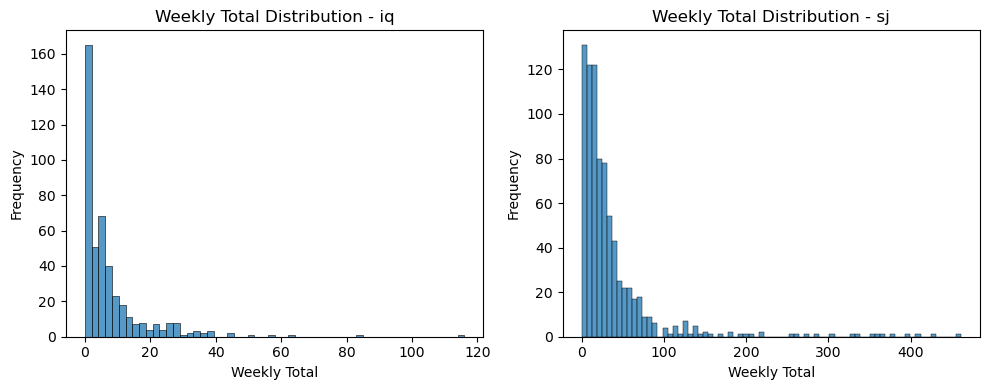

In [37]:
# 
def yearly_pattern(labels_data, city_col, total_cases_col):

    cities = labels_data[city_col].unique()
    num_cities = len(cities)
    fig, axes = plt.subplots(ncols=num_cities, figsize=(10, 4))

    # Iterate over each city and plot distplot
    for i, city in enumerate(cities):
        city_data = labels_data[labels_data[city_col] == city][total_cases_col]
        sns.histplot(city_data, kde=False, ax=axes[i])
        axes[i].set_title(f'Weekly Total Distribution - {city}')
        axes[i].set_xlabel('Weekly Total')
        axes[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()


yearly_pattern(df_train, 'city', 'total_cases')

Seems like week 1 and week 53 are the most problematic in the dataset

In [38]:
# Computing median by week
def medianByWeek(df):
    df_med = df[features+['city','weekofyear']].groupby(['city', 'weekofyear']).agg('median').reset_index()
    rename_dict = {}
    for feature in features:
        rename_dict[feature]='med_'+feature
        df_med.rename(rename_dict, inplace=True, axis=1)
    return df_med

df_med = medianByWeek(df=df_train)

In [39]:
df_med


,city,weekofyear,med_ndvi_ne,med_ndvi_nw,med_ndvi_se,med_ndvi_sw,med_precipitation_amt_mm,med_reanalysis_air_temp_k,med_reanalysis_avg_temp_k,med_reanalysis_dew_point_temp_k,...,med_reanalysis_relative_humidity_percent,med_reanalysis_sat_precip_amt_mm,med_reanalysis_specific_humidity_g_per_kg,med_reanalysis_tdtr_k,med_station_avg_temp_c,med_station_diur_temp_rng_c,med_station_max_temp_c,med_station_min_temp_c,med_station_precip_mm,med_total_cases
0,iq,1,0.254714,0.228529,0.250586,0.270400,59.110,298.162857,299.642857,296.060000,...,93.005714,59.110,17.618571,9.757143,28.112500,9.700000,33.30,21.80,72.50,10.0
1,iq,2,0.303274,0.292350,0.290017,0.294814,70.845,297.673571,299.007143,296.157857,...,93.420000,70.845,17.730000,7.828571,27.606667,10.300000,34.20,22.25,60.80,8.0
2,iq,3,0.256493,0.195148,0.268136,0.224971,76.160,298.201429,299.796429,296.355000,...,92.165000,76.160,17.958571,8.864286,28.000000,9.900000,33.80,22.10,96.70,8.0
3,iq,4,0.231279,0.225769,0.214421,0.285093,67.035,297.870000,299.007143,295.833571,...,90.213571,67.035,17.427857,8.100000,27.940000,10.600000,33.90,21.95,56.70,8.5
4,iq,5,0.233014,0.235186,0.196486,0.205543,71.550,298.271429,299.792857,296.392143,...,93.067857,71.550,17.977143,9.042857,27.725000,10.300000,34.35,22.25,89.60,6.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99,sj,48,0.108625,0.103867,0.179629,0.166186,16.860,298.832857,298.935714,295.256429,...,80.243571,16.860,16.662857,2.085714,26.335714,6.350000,30.60,22.80,29.90,40.0
100,sj,49,0.056750,0.065875,0.181267,0.206850,4.150,298.560714,298.617857,294.795714,...,78.376429,4.150,16.182857,2.000000,26.278571,6.350000,30.30,21.95,24.15,28.0
101,sj,50,-0.003900,0.014733,0.191386,0.173014,0.000,298.595000,298.667857,294.423571,...,75.265714,0.000,15.802857,2.192857,25.864286,6.607143,29.70,21.70,9.90,31.0
102,sj,51,-0.000425,0.046133,0.182817,0.170057,0.000,298.435714,298.546429,294.222857,...,77.476429,0.000,15.622857,2.200000,25.778571,6.007143,30.30,21.70,22.60,24.5


## Median of features by 
 - There is considerable difference in climate and vegetation between the two cities

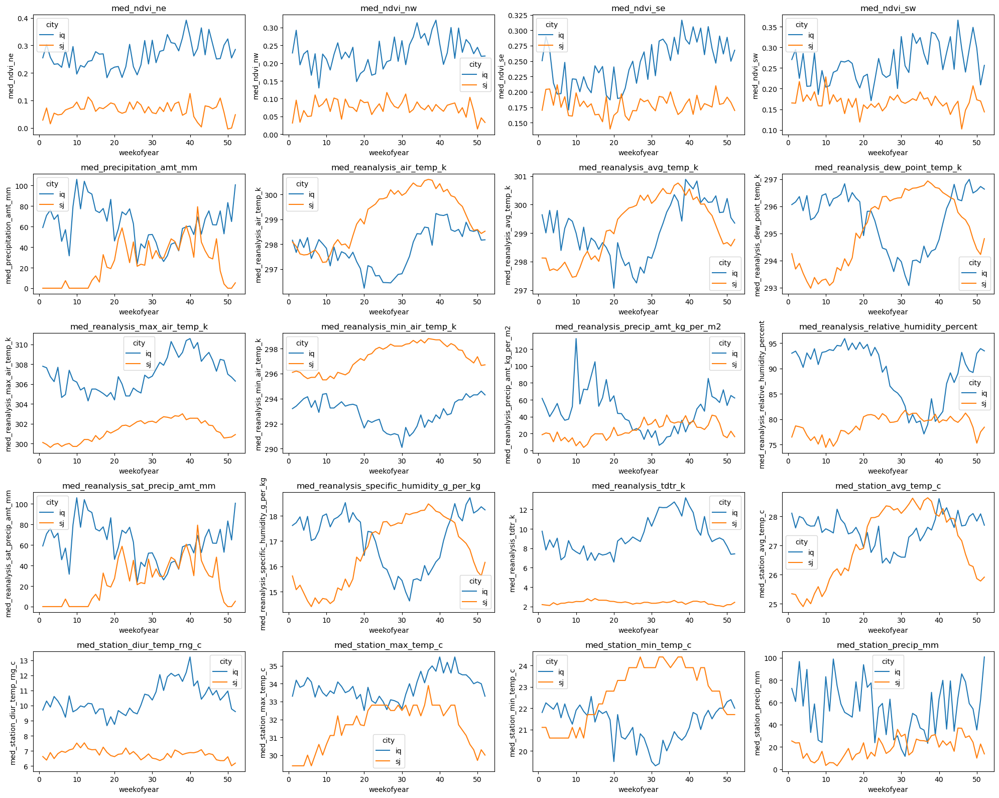

In [40]:
med_features = df_med.columns[1:]

fig, axs = plt.subplots(5,4, figsize = (20,16))
axs = axs.ravel()

for f, ax in zip(med_features[1:],axs):
    sns.lineplot(data=df_med, x = 'weekofyear', y=f, ax=ax, hue='city')
    ax.set_title(f)
plt.tight_layout()


## Features vs Target (standardized)

In [41]:
df_train_iq.columns

Index(['city', 'year', 'weekofyear', 'week_start_date', 'ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k',
       'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_sat_precip_amt_mm',
       'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k',
       'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c',
       'station_min_temp_c', 'station_precip_mm', 'total_cases'],
      dtype='object')

## Iquitos
Key observations:
- There is a lagged commovement between temperature and total disease cases in iquitos, eg. increase in temperature is followed by increased number of cases
- The similar effect has also been observed in humidity variable ['reanalysis_specific_humidity_g_per_kg']

In [42]:
import sklearn
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
all_scaled = scaler.fit_transform(X=df_train_iq.iloc[:,4:])
scaler.get_feature_names_out()
df_scaled = pd.DataFrame(all_scaled, columns=scaler.get_feature_names_out())
df_scaled = pd.concat((X[datetimecols], df_scaled), axis=1)

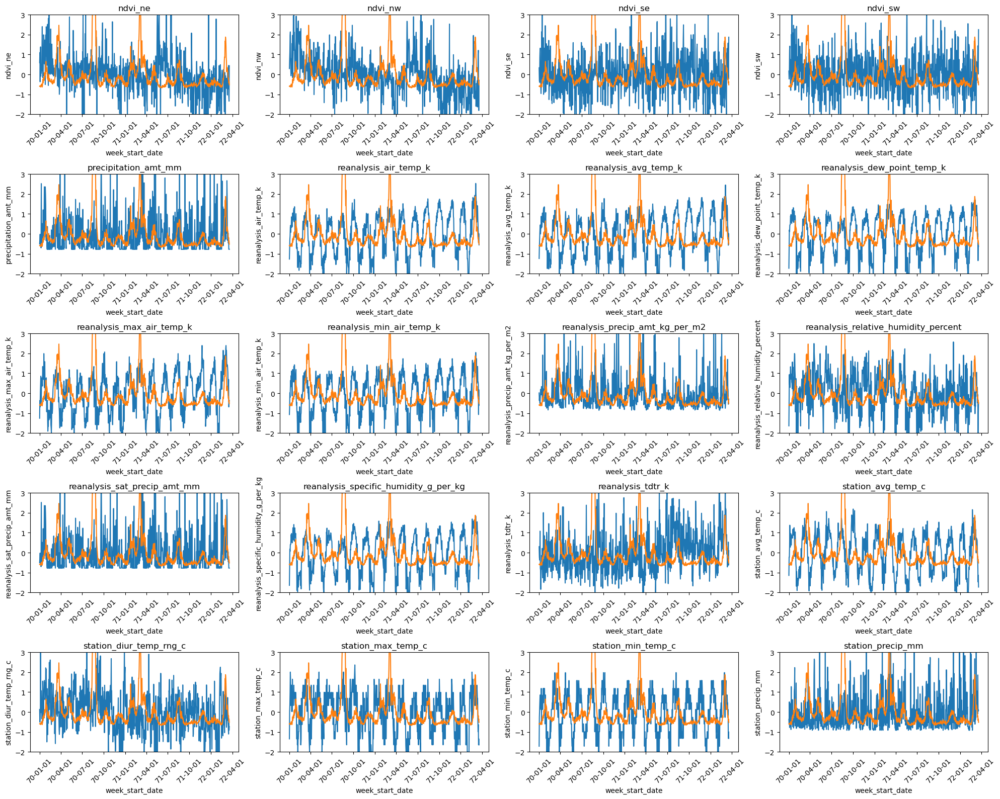

In [43]:
def linePlots2(data, features,hue=None):
    fig, axs = plt.subplots(5, 4, figsize=(20, 16))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.lineplot(x='week_start_date', y=col, ax=ax, data=data, hue=hue)
        sns.lineplot(x='week_start_date', y='total_cases', ax=ax, data=data, hue=hue)
        ax.xaxis.set_major_locator(mdates.AutoDateLocator(minticks=5, maxticks=15))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d'))
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)
        ax.set_ylim(-2,3)
    plt.tight_layout()
    plt.show()

linePlots2(data=df_scaled[df_scaled['city']=='sj'], features=features)

## Box plots
- The scales of features are quite different, scling may be necessary for non-tree based algorithms
- Outliers are also evident especially for precipitation

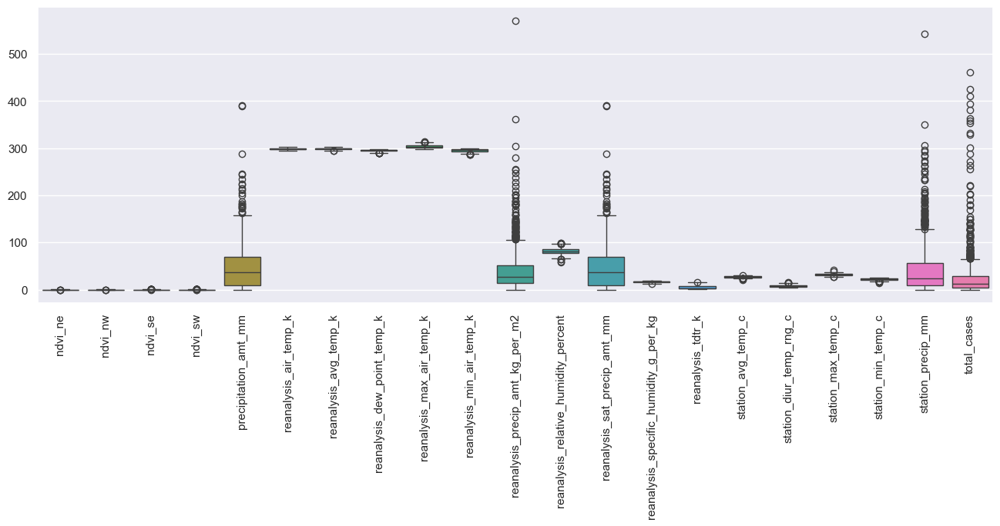

In [44]:
sns.set(rc={'figure.figsize': (16, 5)})

# Create the boxplot
ax = sns.boxplot(data=df_train[features[:]])
ax.tick_params(axis='x', rotation=90)


# Show the plot
plt.show()

### Box plots
- There is considerable difference between cities esp. for vegetation, humidity and temperature
- It may necessitate doing analysis separately
- Cases in in San Juan are generally higher compared to Iquitos

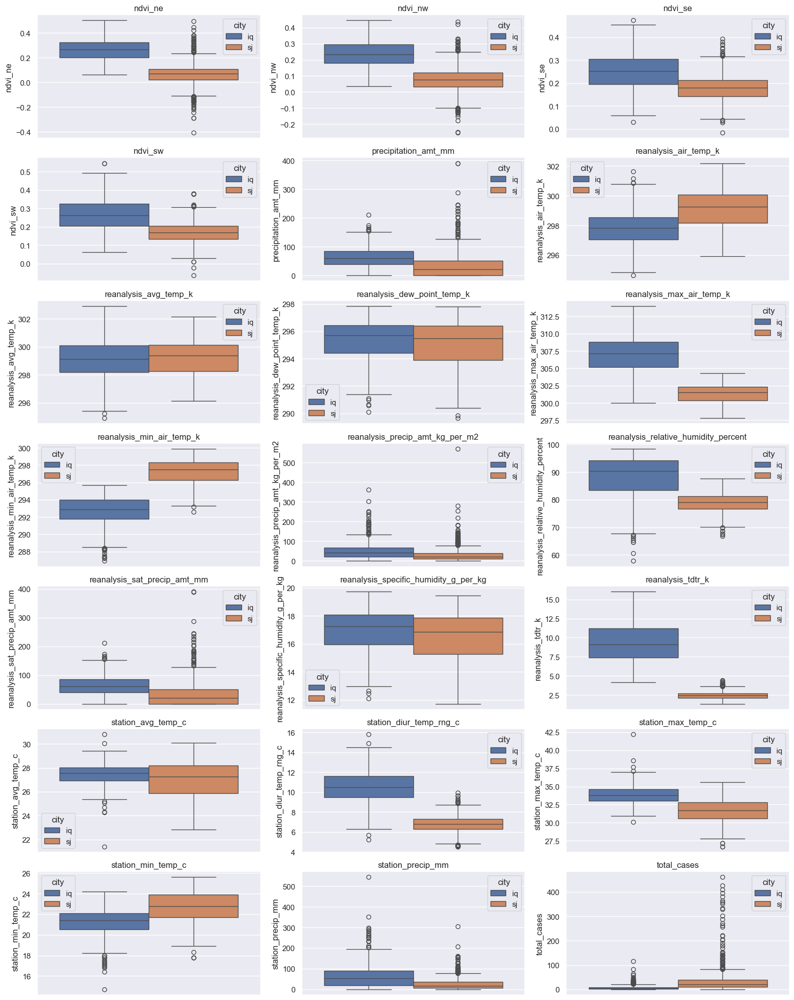

In [45]:
def boxplots(data, features,hue=None):
    fig, axs = plt.subplots(7, 3, figsize=(16, 20))
    axs = axs.ravel()

    for col, ax in zip(features, axs):
        sns.boxplot(y=col, ax=ax, data=data, hue=hue)
        ax.set_title(col)
        ax.tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

boxplots(data=df_train, features=features, hue='city')

In [46]:
ndvi = list(filter(lambda x: re.search(r'ndvi_', x), features))
precip = list(filter(lambda x: re.search(r'preci', x), features))
humid = list(filter(lambda x: re.search(r'humid', x), features))
temp = list(filter(lambda x: re.search(r'temp|tdtr', x), features))
# tdtr = list(filter(lambda x: re.search(r'tdtr', x), features))

In [47]:
## PCA PLOTS
from sklearn.decomposition import PCA
pca = PCA(n_components=2, whiten=True)

pca_ndvi = pca.fit_transform(df_train.loc[df_train['city']=='sj',ndvi])
print('ndvi', pca.explained_variance_ratio_)
pca_ndvi = pd.DataFrame(pca_ndvi, columns=['pc1','pc2'])


pca_precip = pca.fit_transform(df_train.loc[df_train['city']=='sj',precip])
print('precip', pca.explained_variance_ratio_)
pca_precip = pd.DataFrame(pca_precip, columns=['pc1','pc2'])

pca_temp = pca.fit_transform(df_train.loc[df_train['city']=='sj',temp])
print('temp', pca.explained_variance_ratio_)
pca_temp = pd.DataFrame(pca_temp, columns=['pc1','pc2'])


ndvi [0.60810573 0.22842592]
precip [0.77866656 0.1463693 ]
temp [0.79642597 0.10359842]


In [48]:
df_train.loc[:,'l_total_cases'] = np.log(1+df_train['total_cases'])

#EDA: Data Visualization
[Helen]

In [49]:
# df_train['week_start_date'] = pd.to_datetime(df_train['week_start_date'])
# df_train.set_index('week_start_date', inplace=True)

In [50]:
# from statsmodels.tsa.seasonal import seasonal_decompose
# city = df_train[df_train['city'] == 'iq']
# result = seasonal_decompose(city['precipitation_amt_mm'].resample('M').sum(), model='additive')
# result.plot()
# plt.show()

Observation of the Trends and Seasons of Iquitos:


*   The trend appears to be stable with slight flunctuations over the years, a slight upward trend can be observed around 2005 but it returns to more average levels afterward and then rises before 2007.
*   The Seasonal pattern is clear and consistent over the years. Peaks and troughs appear regularly, indicating consistent wetter and drier periods each year.
*   The residuals, which represent the noise after removing the trend and seasonality, don't show any significant outliers or patterns. They're relatively stable and clustered around the zero line.

In [51]:
# from statsmodels.tsa.seasonal import seasonal_decompose
# city = df_train[df_train['city'] == 'sj']
# result = seasonal_decompose(city['precipitation_amt_mm'].resample('M').sum(), model='additive')
# result.plot()
# plt.show()

Observation of the Trends and Seasons of San Juan:


*   The trend appears to be stable with slight undulations over the years, there is no strong long term increase or decrease in the population during the time period.
*   The Seasonal pattern is clear and consistent over the years. The amplitude of the season flunctuations are roughly the same size each year.
*   The residuals have a few outliers, seen as dots further away 

##### Dropping one highly correlated variables from the following pairs, 
- ['precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm']
- ['reanalysis_dew_point_temp_k', 'reanalysis_specific_humidity_g_per_kg']
- ['reanalysis_max_air_temp_k', 'reanalysis_tdtr_k']

## Prepare training and testing data

In [52]:
## Generate dummies for outliers
# This applies for training data, we pretend we dont know labels for testing data
df_train['month'] = df_train['week_start_date'].dt.month
df_test['total_cases'] = df_test['total_cases']+1

df_test['month'] = df_test['week_start_date'].dt.month
df_test['total_cases'] = df_test['total_cases']+1

In [53]:
df_train.loc[:,'month'].value_counts()


month
7     125
10    118
4     116
9     107
1     107
8     100
11    100
12    100
5      96
6      96
2      92
3      92
Name: count, dtype: int64

In [93]:
# columns to drop from variable featured
# If you want to keep all variables just, change columns2drop -- leave 'total_cases' only
colums2drop = ['city', 'weekofyear','year','week_start_date', 'reanalysis_sat_precip_amt_mm', 'reanalysis_specific_humidity_g_per_kg', 
               'reanalysis_tdtr_k', 'total_cases', 'l_total_cases']
features2keep = [f for f in df_train.columns if f not in colums2drop]

# def generate_training_test_sets()
X_train_iq = df_train.loc[df_train['city']=='iq',features2keep]
X_train_sj = df_train.loc[df_train['city']=='sj',features2keep]

# Settting indices
X_train_iq.index = df_train.loc[df_train['city']=='iq', 'week_start_date']
X_train_sj.index = df_train.loc[df_train['city']=='sj', 'week_start_date']

# Test set
X_test_iq = df_test.loc[df_test['city']=='iq',features2keep]
X_test_sj = df_test.loc[df_test['city']=='sj',features2keep]

# Settting indices
X_test_iq.index = df_test.loc[df_test['city']=='iq', 'week_start_date']
X_test_sj.index = df_test.loc[df_test['city']=='sj', 'week_start_date']

# Target - Train
y_train_iq = df_train.loc[df_train['city']=='iq',['total_cases']]['total_cases']
y_train_sj = df_train.loc[df_train['city']=='sj',['total_cases']]['total_cases']

# Settting indices
y_train_iq.index = df_train.loc[df_train['city']=='iq', 'week_start_date']
y_train_sj.index = df_train.loc[df_train['city']=='sj', 'week_start_date']

# Target - Test
y_test_iq = df_test.loc[df_test['city']=='iq',['total_cases']]['total_cases']
y_test_sj = df_test.loc[df_test['city']=='sj',['total_cases']]['total_cases']

y_test_iq.index = df_test.loc[df_test['city']=='iq', 'week_start_date']
y_test_sj.index = df_test.loc[df_test['city']=='sj', 'week_start_date']



In [94]:
print(f"Years Train iq: {df_train.loc[df_train['city']=='iq', 'year'].unique()}")
print(f"Years Test iq: {df_test.loc[df_test['city']=='iq', 'year'].unique()}")
# df_test['year'].unique()

Years Train iq: [2000 2001 2002 2003 2004 2005 2006 2007 2008]
Years Test iq: [2009 2010]


In [95]:
print(f"Years Train sj: {df_train.loc[df_train['city']=='sj', 'year'].unique()}")
print(f"Years Test sj: {df_test.loc[df_test['city']=='sj', 'year'].unique()}")

Years Train sj: [1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003
 2004 2005]
Years Test sj: [2006 2007 2008]


## MODELS

In [96]:
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.svm import SVR
from sklearn.compose import TransformedTargetRegressor, ColumnTransformer
from sklearn.model_selection import GridSearchCV, cross_val_score, TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso

CITY = 'iq'
# Model without parameter tuning - San Juan

scaler = Pipeline([('scaler', StandardScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])

transformer = ColumnTransformer([('scaler', scaler, features2keep)])

regressor = SVR(kernel='rbf', C=0.6)
tscv = TimeSeriesSplit(n_splits=5)

target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)

pipeline = Pipeline(steps=[('preprocess', transformer), ('select', selector) ,('tranform_target', target_transformer)])
# pipeline = Pipeline(steps=[('preprocess', transformer),('tranform_target', log_target)])
# pipeline = Pipeline(steps=[('preprocess', transformer), ('regress', regressor)])

# compute cross validation error
mae_cv = cross_val_score(estimator= pipeline,X=X_train_iq, y=y_train_iq, cv=tscv)
print(f"MAE cv {CITY} {-np.mean(mae_cv)}")


model = pipeline.fit(X=X_train_iq, y=y_train_iq)
# y_pred_tr = model.predict(X_train_iq)

y_pred_iq = model.predict(X_test_iq)



mae = mean_absolute_error(y_true=y_test_iq, y_pred=y_pred_iq)
print(f"MAE: {mae:.2f}")


MAE cv iq 0.5783546107596772
MAE: 5.09


In [97]:
lasso_selector = model.named_steps['select'].named_steps['lasso']

# Get the selected feature indices
selected_feature_indices = lasso_selector.get_support()

# Get the selected feature names
selected_feature_names = X_train_iq.columns[selected_feature_indices]
print(selected_feature_names)

Index(['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'precipitation_amt_mm',
       'reanalysis_air_temp_k', 'reanalysis_avg_temp_k',
       'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k',
       'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'station_max_temp_c', 'station_min_temp_c', 'month'],
      dtype='object')


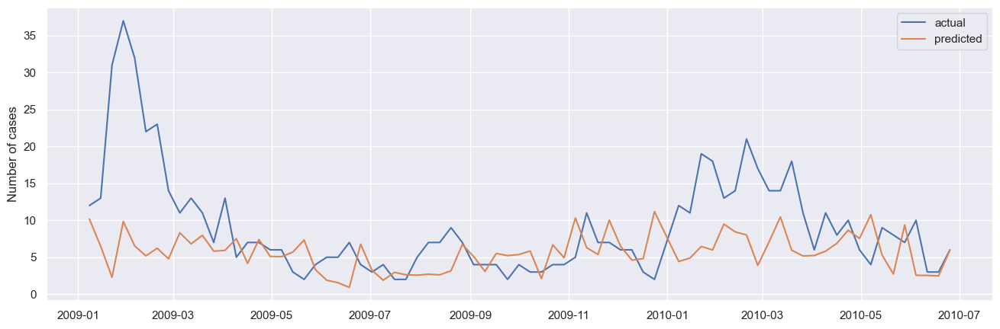

In [98]:
y_pred_iq = pd.Series(y_pred_iq, index=y_test_iq.index)

plt.plot(y_test_iq, label='actual')
plt.plot(y_pred_iq, label = 'predicted')
plt.legend()
plt.ylabel('Number of cases')
plt.show()

In [99]:
# Model without parameter tuning - San Iquitos
scaler = Pipeline([('scaler', StandardScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])

transformer = ColumnTransformer([('scaler', scaler, features2keep)])

regressor = SVR(kernel='rbf',C=0.3)

target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)

pipeline = Pipeline(steps=[('preprocess', transformer), ('select', selector) ,('target_transform', target_transformer)])
# pipeline = Pipeline(steps=[('preprocess', transformer),('tranform_target', log_target)])
# pipeline = Pipeline(steps=[('preprocess', transformer), ('regress', regressor)])

model = pipeline.fit(X=X_train_sj, y=y_train_sj)
# y_pred_tr = model.predict(X_train_iq)

y_pred_sj = model.predict(X_test_sj)

mae = mean_absolute_error(y_true=y_test_sj, y_pred=y_pred_sj)
print(f"MAE: {mae:.2f}")

MAE: 14.69


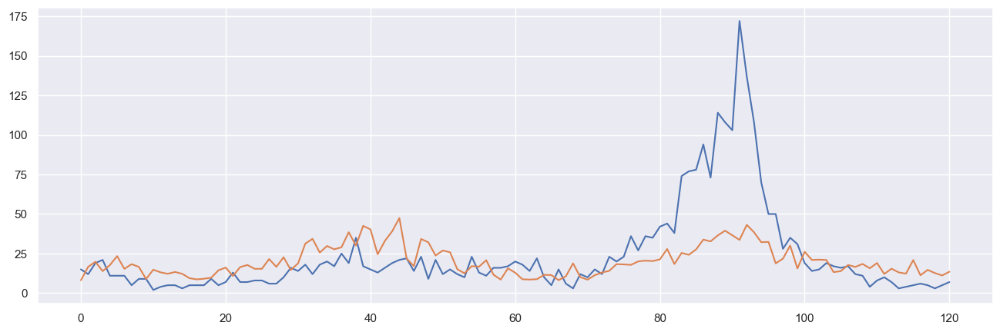

In [100]:
plt.plot(np.array(y_test_sj))
plt.plot(y_pred_sj)


## Finetuning SVR

In [101]:
from sklearn.model_selection import cross_val_score, TimeSeriesSplit
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVR
from sklearn.compose import TransformedTargetRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error
import numpy as np

CITY = 'iq'

# Define the preprocessing steps
scaler = Pipeline([('scaler', RobustScaler())])
selector = Pipeline([('lasso', SelectFromModel(Lasso(alpha=0.05)))])
transformer = ColumnTransformer([('scaler', scaler, features2keep)])

# Define the transformed target regressor
regressor = SVR(kernel='rbf')
target_transformer = TransformedTargetRegressor(regressor=regressor, func=np.log1p, inverse_func=np.expm1)

# Create the pipeline
pipeline = Pipeline(steps=[('preprocess', transformer), ('select', selector), ('transform_target', target_transformer)])

# Define the hyperparameter grid for grid search
param_grid = {
    'transform_target__regressor__C': np.linspace(0.001, 0.1, 10),
    'transform_target__regressor__kernel': ['rbf', 'poly', 'linear'],
    'transform_target__regressor__gamma': np.linspace(0.001, 0.1, 10)
}

# Perform grid search

tscv = TimeSeriesSplit(n_splits=5)

grid_search = GridSearchCV(estimator=pipeline, param_grid=param_grid, cv=tscv, n_jobs=-1, scoring='neg_mean_absolute_error')
models = grid_search.fit(X=X_train_iq, y=y_train_iq)
best_model = models.best_estimator_

# Evaluate the best model
best_model_mae_cv = cross_val_score(estimator=best_model, X=X_train_iq, y=y_train_iq, scoring='neg_mean_absolute_error')

print(f"Cross-validated MAE -{CITY}: {-np.mean(best_model_mae_cv):.2f}")

y_pred_iq = best_model.predict(X_test_iq)
mae = mean_absolute_error(y_true=y_test_iq, y_pred=y_pred_iq)
# print(f"MAE on test set -{CITY}: {mae:.2f}")


Cross-validated MAE -iq: 6.49


In [102]:
for i, (tri, tsi) in enumerate(tscv.split(X_train_iq)):
    print(f"fold {i}")
    print(f" Train indices {tri}")
    print(f" Test indices {tsi}")



fold 0
 Train indices [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71
 72 73 74]
 Test indices [ 75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92
  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109 110
 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128
 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146
 147]
fold 1
 Train indices [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 

In [103]:
# Check parameters of the best model
best_model.named_steps['transform_target'].regressor.get_params()

{'C': 0.012,
 'cache_size': 200,
 'coef0': 0.0,
 'degree': 3,
 'epsilon': 0.1,
 'gamma': 0.001,
 'kernel': 'linear',
 'max_iter': -1,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

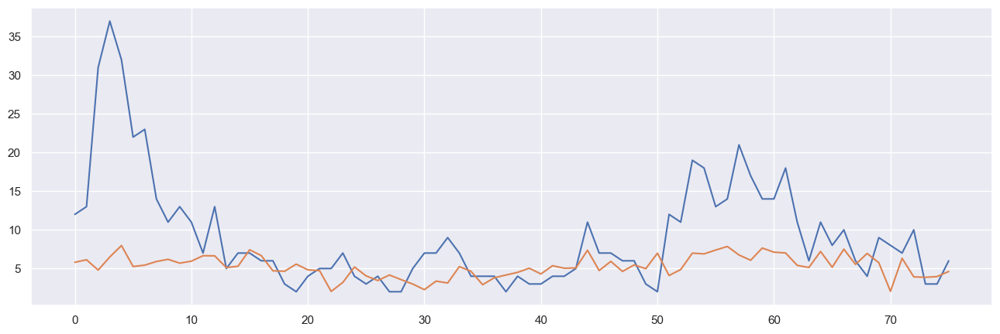

In [104]:
plt.plot(np.array(y_test_iq))
plt.plot(y_pred_iq)


In [105]:
CITY = 'sj'

param_grid = {
    'transform_target__regressor__C': np.linspace(0.001, 0.9, 10),
    'transform_target__regressor__kernel': ['rbf', 'poly', 'linear'],
    # 'transform_target__regressor__gamma': np.linspace(0.01, 0.1, 10)
}

models = grid_search.fit(X=X_train_sj, y=y_train_sj)
best_model = models.best_estimator_

# Evaluate the best model
best_model_mae_cv = cross_val_score(estimator=best_model, X=X_train_sj, y=y_train_sj, scoring='neg_mean_absolute_error')

print(f"Cross-validated MAE -{CITY}: {-np.mean(best_model_mae_cv):.2f}")

y_pred_iq = best_model.predict(X_test_iq)
mae = mean_absolute_error(y_true=y_test_sj, y_pred=y_pred_sj)
print(f"MAE on test set -{CITY}: {mae:.2f}")

Cross-validated MAE -sj: 25.91
MAE on test set -sj: 14.69


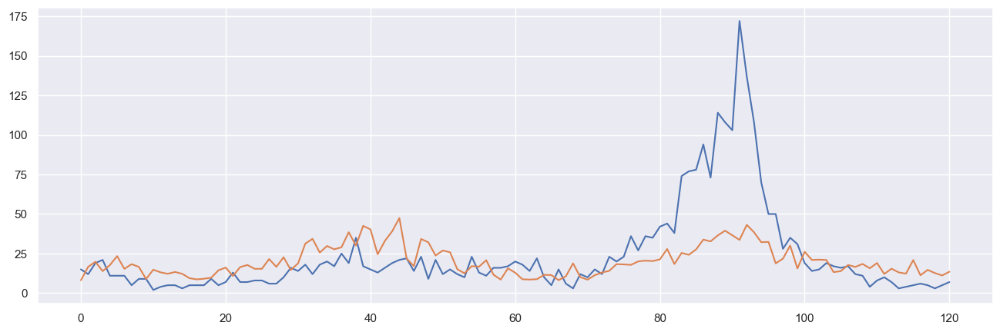

In [106]:
plt.plot(np.array(y_test_sj))
plt.plot(y_pred_sj)


In [107]:
## LSTM

In [108]:
import tensorflow
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, InputLayer, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.losses import MeanSquaredError, MeanAbsoluteError
from tensorflow.keras.metrics import MeanAbsoluteError
from tensorflow.keras.optimizers import Adam
from keras.optimizers import Adam

# Prepare data
time_steps = 4

def data_to_3D(dfx, dfy, time_steps):
    X = []
    y = []
    for i in range(len(dfx) - time_steps):
        X.append(dfx[i:i+time_steps])  # Extracting past 'time_steps' weeks data for each sample
        y.append(dfy.values[i+time_steps])     # Extracting the target variable for the next week
    return np.array(X), np.array(y)


scaler = RobustScaler()

X_train_iq = scaler.fit_transform(X_train_iq)

XX_train_iq, yy_train_iq = data_to_3D(X_train_iq, y_train_iq, time_steps=time_steps)

XX_train_iq, yy_train_iq = XX_train_iq[:len(XX_train_iq)-103,:], yy_train_iq[:len(yy_train_iq)-103]
XX_val_iq, yy_val_iq = XX_train_iq[len(XX_train_iq)-103:,:], yy_train_iq[len(yy_train_iq)-103:]

XX_test_iq, yy_test_iq = data_to_3D(X_test_iq, y_test_iq, time_steps=time_steps)
# scale
X_test_iq = scaler.fit_transform(X_test_iq)


model = Sequential([
    InputLayer(input_shape=(time_steps, 18)),
    LSTM(20),
    Dropout(0.2),
    Dense(units=100, activation='relu'),
    Dense(units=1, activation='linear')
])

model.summary()

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
check_point = ModelCheckpoint('model/', save_best_only=True)

model.compile(loss=MeanSquaredError(), optimizer=Adam(learning_rate=0.001), metrics=[MeanAbsoluteError()])
model.fit(XX_train_iq, yy_train_iq, validation_data=(XX_val_iq, yy_val_iq), epochs=60, callbacks=[check_point, early_stopping])



Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 20)                3120      
                                                                 
 dropout_2 (Dropout)         (None, 20)                0         
                                                                 
 dense_4 (Dense)             (None, 100)               2100      
                                                                 
 dense_5 (Dense)             (None, 1)                 101       
                                                                 
Total params: 5,321
Trainable params: 5,321
Non-trainable params: 0
_________________________________________________________________
Epoch 1/60
 1/11 [=>............................] - ETA: 10s - loss: 98.5950 - mean_absolute_error: 6.8494

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 4s 251ms/step - loss: 152.9516 - mean_absolute_error: 6.6207 - val_loss: 95.5432 - val_mean_absolute_error: 6.9411
Epoch 2/60
 1/11 [=>............................] - ETA: 0s - loss: 46.8564 - mean_absolute_error: 4.8164

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 230ms/step - loss: 150.2556 - mean_absolute_error: 6.5001 - val_loss: 92.4960 - val_mean_absolute_error: 6.7592
Epoch 3/60
 1/11 [=>............................] - ETA: 0s - loss: 81.1351 - mean_absolute_error: 5.1247

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 208ms/step - loss: 147.0510 - mean_absolute_error: 6.3778 - val_loss: 88.5601 - val_mean_absolute_error: 6.5258
Epoch 4/60
 1/11 [=>............................] - ETA: 0s - loss: 35.4294 - mean_absolute_error: 4.5325

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 233ms/step - loss: 142.7683 - mean_absolute_error: 6.2052 - val_loss: 82.6302 - val_mean_absolute_error: 6.1698
Epoch 5/60
 1/11 [=>............................] - ETA: 0s - loss: 101.5004 - mean_absolute_error: 6.2807

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 211ms/step - loss: 136.8480 - mean_absolute_error: 5.9664 - val_loss: 73.7359 - val_mean_absolute_error: 5.6363
Epoch 6/60
 1/11 [=>............................] - ETA: 0s - loss: 71.6373 - mean_absolute_error: 5.1899

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 204ms/step - loss: 127.5240 - mean_absolute_error: 5.6696 - val_loss: 61.8821 - val_mean_absolute_error: 4.9411
Epoch 7/60
 1/11 [=>............................] - ETA: 0s - loss: 85.6688 - mean_absolute_error: 5.7029

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 244ms/step - loss: 116.2627 - mean_absolute_error: 5.3856 - val_loss: 49.5276 - val_mean_absolute_error: 4.2613
Epoch 8/60
 1/11 [=>............................] - ETA: 0s - loss: 247.4287 - mean_absolute_error: 7.8188

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 213ms/step - loss: 107.4862 - mean_absolute_error: 5.3503 - val_loss: 41.9944 - val_mean_absolute_error: 4.0963
Epoch 9/60
 1/11 [=>............................] - ETA: 0s - loss: 35.7135 - mean_absolute_error: 4.2449

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 215ms/step - loss: 102.4205 - mean_absolute_error: 5.5261 - val_loss: 40.3375 - val_mean_absolute_error: 4.2873
Epoch 10/60
 1/11 [=>............................] - ETA: 0s - loss: 56.3159 - mean_absolute_error: 5.5888

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 243ms/step - loss: 100.5833 - mean_absolute_error: 5.8589 - val_loss: 39.7989 - val_mean_absolute_error: 4.3533
Epoch 11/60
 1/11 [=>............................] - ETA: 0s - loss: 194.5261 - mean_absolute_error: 6.4437

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 210ms/step - loss: 99.3417 - mean_absolute_error: 5.8082 - val_loss: 39.4158 - val_mean_absolute_error: 4.3412
Epoch 12/60
 1/11 [=>............................] - ETA: 0s - loss: 24.3456 - mean_absolute_error: 4.0214

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 244ms/step - loss: 95.9455 - mean_absolute_error: 5.7628 - val_loss: 39.4027 - val_mean_absolute_error: 4.3946
Epoch 13/60
 1/11 [=>............................] - ETA: 0s - loss: 69.2464 - mean_absolute_error: 5.9979

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 220ms/step - loss: 97.5150 - mean_absolute_error: 5.7500 - val_loss: 38.2910 - val_mean_absolute_error: 4.2332
Epoch 14/60
 1/11 [=>............................] - ETA: 0s - loss: 47.0769 - mean_absolute_error: 5.3561

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 215ms/step - loss: 95.6136 - mean_absolute_error: 5.6246 - val_loss: 38.0688 - val_mean_absolute_error: 4.1244
Epoch 15/60
11/11 [==============================] - 0s 5ms/step - loss: 94.1731 - mean_absolute_error: 5.6171 - val_loss: 38.6060 - val_mean_absolute_error: 4.2838
Epoch 16/60
11/11 [==============================] - 0s 5ms/step - loss: 95.3067 - mean_absolute_error: 5.6948 - val_loss: 38.4374 - val_mean_absolute_error: 4.2847
Epoch 17/60
11/11 [==============================] - 0s 5ms/step - loss: 94.3807 - mean_absolute_error: 5.5408 - val_loss: 38.1713 - val_mean_absolute_error: 4.2708
Epoch 18/60
 1/11 [=>............................] - ETA: 0s - loss: 202.2277 - mean_absolute_error: 7.2462

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 244ms/step - loss: 94.4168 - mean_absolute_error: 5.5322 - val_loss: 38.0387 - val_mean_absolute_error: 4.2290
Epoch 19/60
 1/11 [=>............................] - ETA: 0s - loss: 375.4213 - mean_absolute_error: 8.3711

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 216ms/step - loss: 89.8494 - mean_absolute_error: 5.4619 - val_loss: 37.8367 - val_mean_absolute_error: 4.2469
Epoch 20/60
11/11 [==============================] - 0s 5ms/step - loss: 88.2331 - mean_absolute_error: 5.4549 - val_loss: 38.3418 - val_mean_absolute_error: 4.3151
Epoch 21/60
11/11 [==============================] - 0s 5ms/step - loss: 86.9339 - mean_absolute_error: 5.4026 - val_loss: 38.2605 - val_mean_absolute_error: 4.2952
Epoch 22/60
11/11 [==============================] - 0s 5ms/step - loss: 86.6285 - mean_absolute_error: 5.3463 - val_loss: 38.3932 - val_mean_absolute_error: 4.3174
Epoch 23/60
11/11 [==============================] - 0s 5ms/step - loss: 85.8903 - mean_absolute_error: 5.4397 - val_loss: 38.4170 - val_mean_absolute_error: 4.3539
Epoch 24/60
 1/11 [=>............................] - ETA: 0s - loss: 47.0553 - mean_absolute_error: 5.0737

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 232ms/step - loss: 87.7493 - mean_absolute_error: 5.4092 - val_loss: 37.0510 - val_mean_absolute_error: 4.2401
Epoch 25/60
11/11 [==============================] - 0s 5ms/step - loss: 85.7887 - mean_absolute_error: 5.2121 - val_loss: 37.6038 - val_mean_absolute_error: 4.2425
Epoch 26/60
11/11 [==============================] - 0s 5ms/step - loss: 83.6092 - mean_absolute_error: 5.1030 - val_loss: 37.6363 - val_mean_absolute_error: 4.2648
Epoch 27/60
 1/11 [=>............................] - ETA: 0s - loss: 24.4996 - mean_absolute_error: 4.0893

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 223ms/step - loss: 81.4278 - mean_absolute_error: 5.1787 - val_loss: 36.5206 - val_mean_absolute_error: 4.2463
Epoch 28/60
 1/11 [=>............................] - ETA: 0s - loss: 53.2137 - mean_absolute_error: 4.8480

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 236ms/step - loss: 78.5134 - mean_absolute_error: 5.1116 - val_loss: 34.9881 - val_mean_absolute_error: 4.1583
Epoch 29/60
 1/11 [=>............................] - ETA: 0s - loss: 52.4714 - mean_absolute_error: 5.2176

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 3s 256ms/step - loss: 78.2924 - mean_absolute_error: 4.9463 - val_loss: 34.9654 - val_mean_absolute_error: 4.1658
Epoch 30/60
 1/11 [=>............................] - ETA: 0s - loss: 49.4554 - mean_absolute_error: 4.9076

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 213ms/step - loss: 71.9098 - mean_absolute_error: 4.8469 - val_loss: 34.1834 - val_mean_absolute_error: 4.1498
Epoch 31/60
11/11 [==============================] - 0s 5ms/step - loss: 75.7428 - mean_absolute_error: 5.0290 - val_loss: 36.4805 - val_mean_absolute_error: 4.3783
Epoch 32/60
11/11 [==============================] - 0s 5ms/step - loss: 70.9436 - mean_absolute_error: 4.9374 - val_loss: 34.3664 - val_mean_absolute_error: 4.1946
Epoch 33/60
 1/11 [=>............................] - ETA: 0s - loss: 41.7252 - mean_absolute_error: 4.4825

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 222ms/step - loss: 72.2965 - mean_absolute_error: 4.7148 - val_loss: 31.0884 - val_mean_absolute_error: 3.9512
Epoch 34/60
11/11 [==============================] - 0s 6ms/step - loss: 69.0953 - mean_absolute_error: 4.7319 - val_loss: 31.8059 - val_mean_absolute_error: 4.0852
Epoch 35/60
 1/11 [=>............................] - ETA: 0s - loss: 29.1252 - mean_absolute_error: 3.8262

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 3s 263ms/step - loss: 73.0264 - mean_absolute_error: 4.7015 - val_loss: 30.5461 - val_mean_absolute_error: 4.0188
Epoch 36/60
 1/11 [=>............................] - ETA: 0s - loss: 39.3720 - mean_absolute_error: 4.3165

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 231ms/step - loss: 65.7279 - mean_absolute_error: 4.5320 - val_loss: 30.4661 - val_mean_absolute_error: 3.9742
Epoch 37/60
 1/11 [=>............................] - ETA: 0s - loss: 403.7376 - mean_absolute_error: 8.9016

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 3s 264ms/step - loss: 68.4186 - mean_absolute_error: 4.5361 - val_loss: 30.1668 - val_mean_absolute_error: 3.9567
Epoch 38/60
 1/11 [=>............................] - ETA: 0s - loss: 20.3171 - mean_absolute_error: 3.4315

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 226ms/step - loss: 62.3665 - mean_absolute_error: 4.4899 - val_loss: 28.9958 - val_mean_absolute_error: 3.8689
Epoch 39/60
11/11 [==============================] - 0s 5ms/step - loss: 60.6752 - mean_absolute_error: 4.3331 - val_loss: 29.1870 - val_mean_absolute_error: 3.8806
Epoch 40/60
 1/11 [=>............................] - ETA: 0s - loss: 26.9492 - mean_absolute_error: 4.2358

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 217ms/step - loss: 58.6885 - mean_absolute_error: 4.2614 - val_loss: 28.0807 - val_mean_absolute_error: 3.7911
Epoch 41/60
 1/11 [=>............................] - ETA: 0s - loss: 31.3100 - mean_absolute_error: 3.7613

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 241ms/step - loss: 55.9301 - mean_absolute_error: 4.3250 - val_loss: 27.8845 - val_mean_absolute_error: 3.8302
Epoch 42/60
11/11 [==============================] - 0s 5ms/step - loss: 56.1974 - mean_absolute_error: 4.2779 - val_loss: 28.9992 - val_mean_absolute_error: 3.8969
Epoch 43/60
 1/11 [=>............................] - ETA: 0s - loss: 45.7572 - mean_absolute_error: 4.8316

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 228ms/step - loss: 55.6746 - mean_absolute_error: 4.1888 - val_loss: 27.5174 - val_mean_absolute_error: 3.7629
Epoch 44/60
 1/11 [=>............................] - ETA: 0s - loss: 14.4068 - mean_absolute_error: 2.8027

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 241ms/step - loss: 55.5711 - mean_absolute_error: 4.0820 - val_loss: 26.4377 - val_mean_absolute_error: 3.6637
Epoch 45/60
 1/11 [=>............................] - ETA: 0s - loss: 29.4783 - mean_absolute_error: 3.9251

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 220ms/step - loss: 51.0206 - mean_absolute_error: 4.1805 - val_loss: 25.3329 - val_mean_absolute_error: 3.6552
Epoch 46/60
 1/11 [=>............................] - ETA: 0s - loss: 23.5625 - mean_absolute_error: 3.4075

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 213ms/step - loss: 54.2098 - mean_absolute_error: 4.1900 - val_loss: 25.0473 - val_mean_absolute_error: 3.6309
Epoch 47/60
11/11 [==============================] - 0s 5ms/step - loss: 48.2419 - mean_absolute_error: 4.1201 - val_loss: 25.5312 - val_mean_absolute_error: 3.5989
Epoch 48/60
 1/11 [=>............................] - ETA: 0s - loss: 28.6735 - mean_absolute_error: 3.6012

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 3s 259ms/step - loss: 47.4573 - mean_absolute_error: 3.8451 - val_loss: 23.8940 - val_mean_absolute_error: 3.5331
Epoch 49/60
11/11 [==============================] - 0s 5ms/step - loss: 47.8835 - mean_absolute_error: 4.0145 - val_loss: 24.0674 - val_mean_absolute_error: 3.5442
Epoch 50/60
 1/11 [=>............................] - ETA: 0s - loss: 30.0932 - mean_absolute_error: 3.8127

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 213ms/step - loss: 43.7311 - mean_absolute_error: 3.6736 - val_loss: 23.1563 - val_mean_absolute_error: 3.4748
Epoch 51/60
 1/11 [=>............................] - ETA: 0s - loss: 19.1208 - mean_absolute_error: 3.4200

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 218ms/step - loss: 44.5357 - mean_absolute_error: 3.8616 - val_loss: 23.1364 - val_mean_absolute_error: 3.4777
Epoch 52/60
 1/11 [=>............................] - ETA: 0s - loss: 26.6855 - mean_absolute_error: 3.5964

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 247ms/step - loss: 44.6853 - mean_absolute_error: 3.9953 - val_loss: 21.6828 - val_mean_absolute_error: 3.4033
Epoch 53/60
 1/11 [=>............................] - ETA: 0s - loss: 26.6529 - mean_absolute_error: 3.5094

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 227ms/step - loss: 44.1459 - mean_absolute_error: 3.8095 - val_loss: 21.6758 - val_mean_absolute_error: 3.3933
Epoch 54/60
 1/11 [=>............................] - ETA: 0s - loss: 18.9977 - mean_absolute_error: 3.3276

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 244ms/step - loss: 37.8127 - mean_absolute_error: 3.7813 - val_loss: 21.0523 - val_mean_absolute_error: 3.3621
Epoch 55/60
 1/11 [=>............................] - ETA: 0s - loss: 22.7015 - mean_absolute_error: 3.5128

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 217ms/step - loss: 37.1566 - mean_absolute_error: 3.7391 - val_loss: 20.2386 - val_mean_absolute_error: 3.3451
Epoch 56/60
 1/11 [=>............................] - ETA: 0s - loss: 16.6974 - mean_absolute_error: 2.9298

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 218ms/step - loss: 39.2859 - mean_absolute_error: 3.6849 - val_loss: 20.1927 - val_mean_absolute_error: 3.2974
Epoch 57/60
11/11 [==============================] - 0s 5ms/step - loss: 37.5041 - mean_absolute_error: 3.7524 - val_loss: 20.6216 - val_mean_absolute_error: 3.3180
Epoch 58/60
 1/11 [=>............................] - ETA: 0s - loss: 26.4326 - mean_absolute_error: 3.6193

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 246ms/step - loss: 36.8792 - mean_absolute_error: 3.6265 - val_loss: 19.6002 - val_mean_absolute_error: 3.2479
Epoch 59/60
 1/11 [=>............................] - ETA: 0s - loss: 46.4861 - mean_absolute_error: 4.0728

INFO:tensorflow:Assets written to: model\assets


INFO:tensorflow:Assets written to: model\assets


11/11 [==============================] - 2s 217ms/step - loss: 32.1791 - mean_absolute_error: 3.5715 - val_loss: 19.3563 - val_mean_absolute_error: 3.2428
Epoch 60/60
11/11 [==============================] - 0s 6ms/step - loss: 32.1264 - mean_absolute_error: 3.4570 - val_loss: 19.9152 - val_mean_absolute_error: 3.2562


4/4 [==============================] - 0s 2ms/step


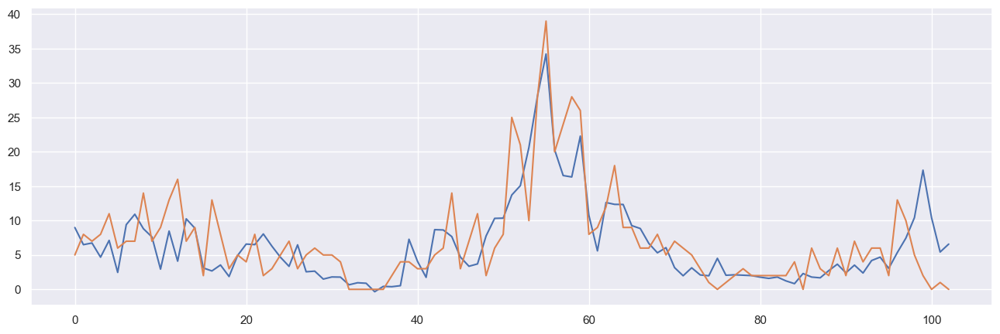

In [109]:
from tensorflow.keras.models import load_model
model = load_model('model/')

pred_train = model.predict(XX_val_iq).flatten()
output_train = pd.DataFrame({'Pred Train': pred_train, 'Actual':yy_val_iq})
# output_train
plt.plot(output_train['Pred Train'])
plt.plot(output_train['Actual'])


3/3 [==============================] - 0s 4ms/step


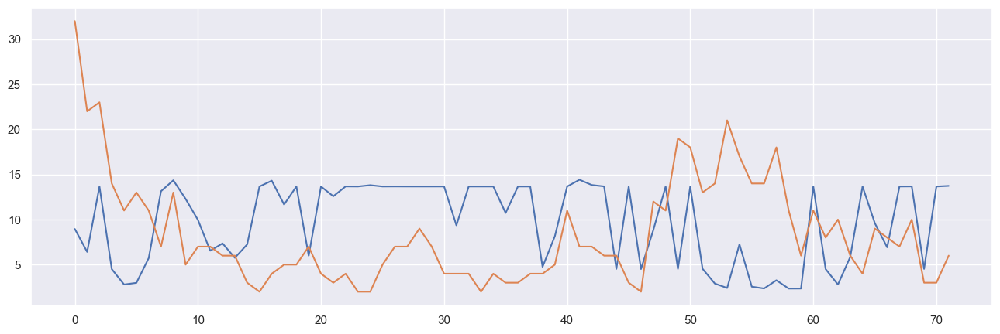

In [110]:
from tensorflow.keras.models import load_model
model = load_model('model/')

pred_test = model.predict(XX_test_iq).flatten()
output_test = pd.DataFrame({'Pred': pred_test, 'Actual':yy_test_iq})
# output_train
plt.plot(output_test['Pred'])
plt.plot(output_test['Actual'])
